# Proyek Machine Learning: Date  Fruit Classification

- **Nama:** Umar Sani
- **Email:** umarsani@student.uns.ac.id
- **ID Dicoding:** umarsani16

## Import Libraries

In [1]:
import zipfile
import os, shutil
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Load Data

In [2]:
# Unduh dataset dari Kaggle

! kaggle datasets download -d muratkokludataset/date-fruit-datasets

Dataset URL: https://www.kaggle.com/datasets/muratkokludataset/date-fruit-datasets
License(s): CC0-1.0
  0% 0.00/408k [00:00<?, ?B/s]
100% 408k/408k [00:00<00:00, 89.0MB/s]


In [3]:
# Ekstrak dataset

def extract(source, destination):
    zip = zipfile.ZipFile(source, "r")
    zip.extractall(destination)
    zip.close()
    print("[SUCCESS] {} berhasil diekstrak ke '{}'".format(os.path.basename(source), destination))

source = "/content/date-fruit-datasets.zip"
destination = "/content/date-fruit-datasets"

extract(source, destination)

[SUCCESS] date-fruit-datasets.zip berhasil diekstrak ke '/content/date-fruit-datasets'


In [4]:
# Muat dataset yang berbentuk .xlsx

df = pd.read_excel('/content/date-fruit-datasets/Date_Fruit_Datasets/Date_Fruit_Datasets.xlsx')

## Data Analysis

Pertama, mari kita lihat bagaimana struktur dataset tersebut dengan menampilkan 10 baris teratas.

In [5]:
df.head(10)

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,...,KurtosisRR,KurtosisRG,KurtosisRB,EntropyRR,EntropyRG,EntropyRB,ALLdaub4RR,ALLdaub4RG,ALLdaub4RB,Class
0,422163,2378.9080,837.8484,645.6693,0.6373,733.1539,0.9947,424428,0.7831,1.2976,...,3.2370,2.9574,4.2287,-59191263232,-50714214400,-39922372608,58.7255,54.9554,47.8400,BERHI
1,338136,2085.1440,723.8198,595.2073,0.5690,656.1464,0.9974,339014,0.7795,1.2161,...,2.6228,2.6350,3.1704,-34233065472,-37462601728,-31477794816,50.0259,52.8168,47.8315,BERHI
2,526843,2647.3940,940.7379,715.3638,0.6494,819.0222,0.9962,528876,0.7657,1.3150,...,3.7516,3.8611,4.7192,-93948354560,-74738221056,-60311207936,65.4772,59.2860,51.9378,BERHI
3,416063,2351.2100,827.9804,645.2988,0.6266,727.8378,0.9948,418255,0.7759,1.2831,...,5.0401,8.6136,8.2618,-32074307584,-32060925952,-29575010304,43.3900,44.1259,41.1882,BERHI
4,347562,2160.3540,763.9877,582.8359,0.6465,665.2291,0.9908,350797,0.7569,1.3108,...,2.7016,2.9761,4.4146,-39980974080,-35980042240,-25593278464,52.7743,50.9080,42.6666,BERHI
5,408953,2326.6931,840.1821,622.0076,0.6722,721.5921,0.9974,410036,0.7805,1.3508,...,3.6309,6.0285,6.2159,-41140371456,-33146710016,-27907301376,49.7001,45.3190,39.7371,BERHI
6,451414,2457.2080,889.3253,652.4316,0.6796,758.1281,0.9970,452755,0.7877,1.3631,...,3.0703,3.4163,4.9168,-63711666176,-64060743680,-52603465728,57.8060,58.5449,52.4199,BERHI
7,382636,2275.7791,808.0833,609.2819,0.6569,697.9880,0.9931,385277,0.7032,1.3263,...,3.6756,7.0258,5.3254,-29873577984,-33570080768,-33054025728,45.1768,48.2407,47.2167,BERHI
8,546063,2714.9480,916.3737,766.4536,0.5481,833.8279,0.9882,552598,0.7710,1.1956,...,3.4640,3.7416,4.8120,-95262416896,-79321833472,-69569445888,64.6188,59.9127,55.6509,BERHI
9,420044,2391.1230,836.9280,645.1822,0.6370,731.3116,0.9918,423531,0.7853,1.2972,...,3.3729,4.2898,5.4637,-74341122048,-58172182528,-42640556032,64.9094,58.2771,48.4820,BERHI


Berikutnya, kita cek informasi setiap setiap fitur dan apakah ada nilai null di dalamnya.

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 898 entries, 0 to 897
Data columns (total 35 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   AREA           898 non-null    int64  
 1   PERIMETER      898 non-null    float64
 2   MAJOR_AXIS     898 non-null    float64
 3   MINOR_AXIS     898 non-null    float64
 4   ECCENTRICITY   898 non-null    float64
 5   EQDIASQ        898 non-null    float64
 6   SOLIDITY       898 non-null    float64
 7   CONVEX_AREA    898 non-null    int64  
 8   EXTENT         898 non-null    float64
 9   ASPECT_RATIO   898 non-null    float64
 10  ROUNDNESS      898 non-null    float64
 11  COMPACTNESS    898 non-null    float64
 12  SHAPEFACTOR_1  898 non-null    float64
 13  SHAPEFACTOR_2  898 non-null    float64
 14  SHAPEFACTOR_3  898 non-null    float64
 15  SHAPEFACTOR_4  898 non-null    float64
 16  MeanRR         898 non-null    float64
 17  MeanRG         898 non-null    float64
 18  MeanRB    

Berdasarkan data diatas, semua fitur merupakan data numerik, kecuali untuk kolom Class yang merupakan kolom target.

Selain itu, nilai null tidak ditemukan pada dataset tersebut.

Berikutnya, mari kita lihat statistik dari setiap fitur dataset.

In [7]:
df.describe()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,...,SkewRB,KurtosisRR,KurtosisRG,KurtosisRB,EntropyRR,EntropyRG,EntropyRB,ALLdaub4RR,ALLdaub4RG,ALLdaub4RB
count,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,...,898.000000,898.000000,898.000000,898.000000,8.980000e+02,8.980000e+02,8.980000e+02,898.000000,898.000000,898.000000
mean,298295.207127,2057.660953,750.811994,495.872785,0.737468,604.577938,0.981840,303845.592428,0.736267,2.131102,...,0.250518,4.247845,5.110894,3.780928,-3.185021e+10,-2.901860e+10,-2.771876e+10,50.082888,48.805681,48.098393
std,107245.205337,410.012459,144.059326,114.268917,0.088727,119.593888,0.018157,108815.656947,0.053745,17.820778,...,0.632918,2.892357,3.745463,2.049831,2.037241e+10,1.712952e+10,1.484137e+10,16.063125,14.125911,10.813862
min,1987.000000,911.828000,336.722700,2.283200,0.344800,50.298400,0.836600,2257.000000,0.512300,1.065300,...,-1.029100,1.708200,1.607600,1.767200,-1.091224e+11,-9.261697e+10,-8.747177e+10,15.191100,20.524700,22.130000
25%,206948.000000,1726.091500,641.068650,404.684375,0.685625,513.317075,0.978825,210022.750000,0.705875,1.373725,...,-0.196950,2.536625,2.508850,2.577275,-4.429444e+10,-3.894638e+10,-3.564534e+10,38.224425,38.654525,39.250725
50%,319833.000000,2196.345450,791.363400,495.054850,0.754700,638.140950,0.987300,327207.000000,0.746950,1.524150,...,0.135550,3.069800,3.127800,3.080700,-2.826156e+10,-2.620990e+10,-2.392928e+10,53.841300,50.337800,49.614100
75%,382573.000000,2389.716575,858.633750,589.031700,0.802150,697.930525,0.991800,388804.000000,0.775850,1.674750,...,0.593950,4.449850,7.320400,4.283125,-1.460482e+10,-1.433105e+10,-1.660367e+10,63.063350,59.573600,56.666675
max,546063.000000,2811.997100,1222.723000,766.453600,1.000000,833.827900,0.997400,552598.000000,0.856200,535.525700,...,3.092300,26.171100,26.736700,32.249500,-1.627316e+08,-5.627727e+08,-4.370435e+08,79.828900,83.064900,74.104600


Berdasarkan informasi diatas, dapat dilihat bahwa setiap fitur memiliki rentang nilai atau skala yang berbeda. Pada tahap preprocessing skala nilai setiap fitur akan kita normalisasikan agar model machine learning dapat memproses data lebih efisien.

Selanjutnya, mari kita lihat perbandingan jumlah data untuk setiap kelas.

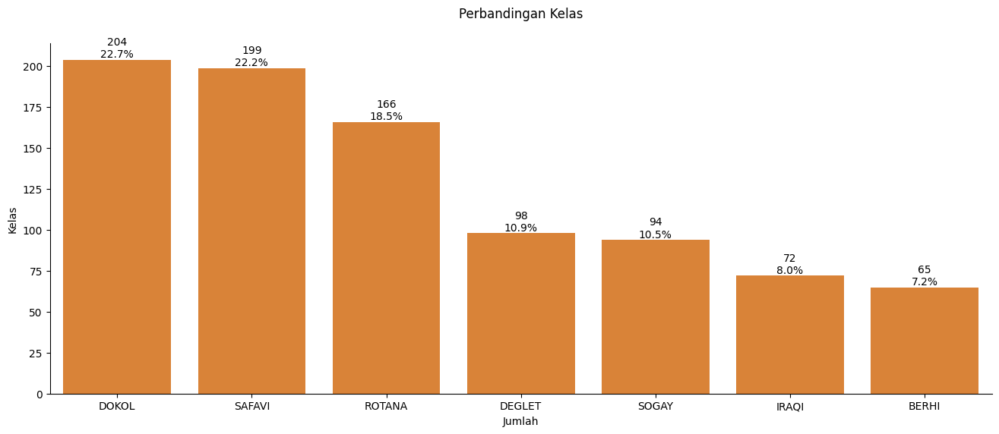

In [8]:
fig = plt.figure(figsize=(16, 6))
ax = fig.add_subplot()

sns.countplot(x='Class', data=df, ax=ax, order=df['Class'].value_counts().index, color='#f4811d')

ax.set_title('Perbandingan Kelas', pad=24)
ax.set_xlabel('Jumlah')
ax.set_ylabel('Kelas')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

for p in ax.patches:
    x = p.get_bbox().get_points()[:, 0]
    y = p.get_bbox().get_points()[1, 1]
    ax.annotate('{}\n{:.1f}%'.format(int(y), 100. * y / len(df)), (x.mean(), y), ha='center', va='bottom')

Lakukan scatterplot dan heatmap untuk melihat korelasi setiap fitur dengan fitur yang lain.

array([[<Axes: xlabel='AREA', ylabel='AREA'>,
        <Axes: xlabel='PERIMETER', ylabel='AREA'>,
        <Axes: xlabel='MAJOR_AXIS', ylabel='AREA'>, ...,
        <Axes: xlabel='ALLdaub4RR', ylabel='AREA'>,
        <Axes: xlabel='ALLdaub4RG', ylabel='AREA'>,
        <Axes: xlabel='ALLdaub4RB', ylabel='AREA'>],
       [<Axes: xlabel='AREA', ylabel='PERIMETER'>,
        <Axes: xlabel='PERIMETER', ylabel='PERIMETER'>,
        <Axes: xlabel='MAJOR_AXIS', ylabel='PERIMETER'>, ...,
        <Axes: xlabel='ALLdaub4RR', ylabel='PERIMETER'>,
        <Axes: xlabel='ALLdaub4RG', ylabel='PERIMETER'>,
        <Axes: xlabel='ALLdaub4RB', ylabel='PERIMETER'>],
       [<Axes: xlabel='AREA', ylabel='MAJOR_AXIS'>,
        <Axes: xlabel='PERIMETER', ylabel='MAJOR_AXIS'>,
        <Axes: xlabel='MAJOR_AXIS', ylabel='MAJOR_AXIS'>, ...,
        <Axes: xlabel='ALLdaub4RR', ylabel='MAJOR_AXIS'>,
        <Axes: xlabel='ALLdaub4RG', ylabel='MAJOR_AXIS'>,
        <Axes: xlabel='ALLdaub4RB', ylabel='MAJOR_AXIS'>],
 

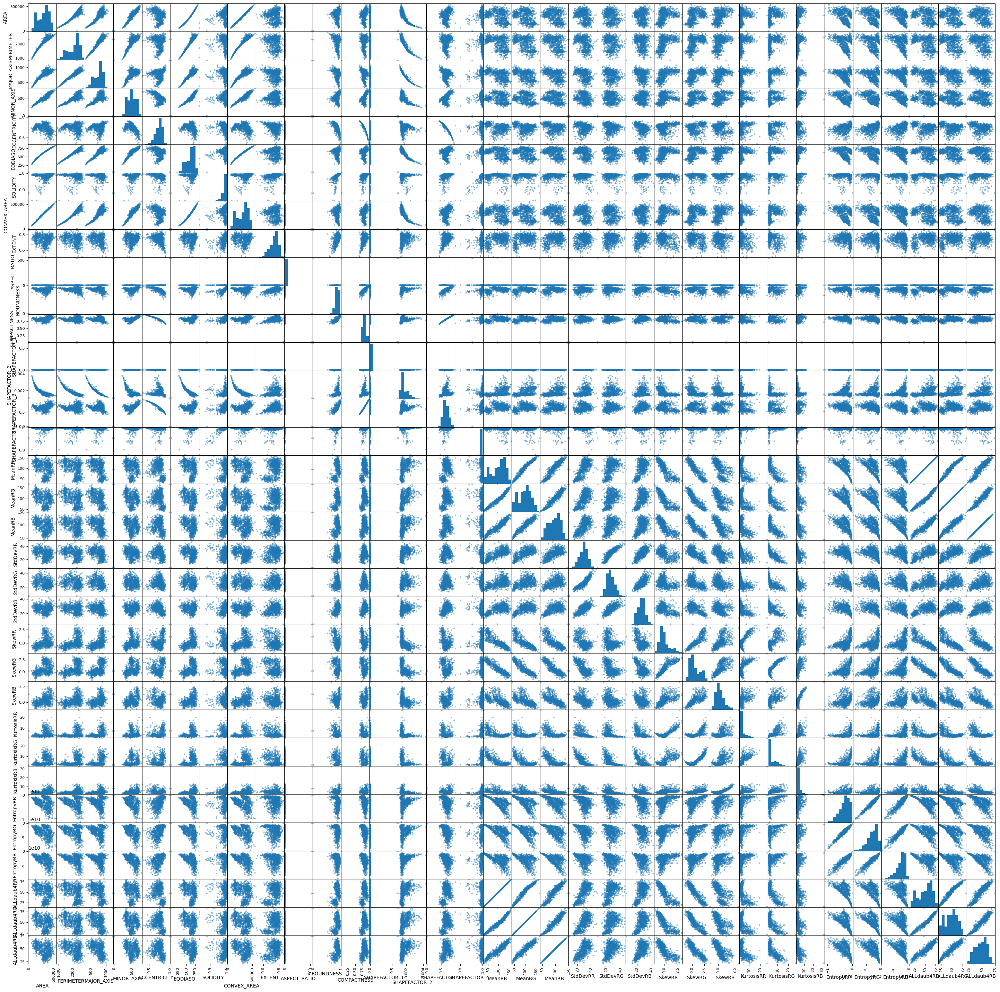

In [9]:
pd.plotting.scatter_matrix(df, figsize=(36, 36))

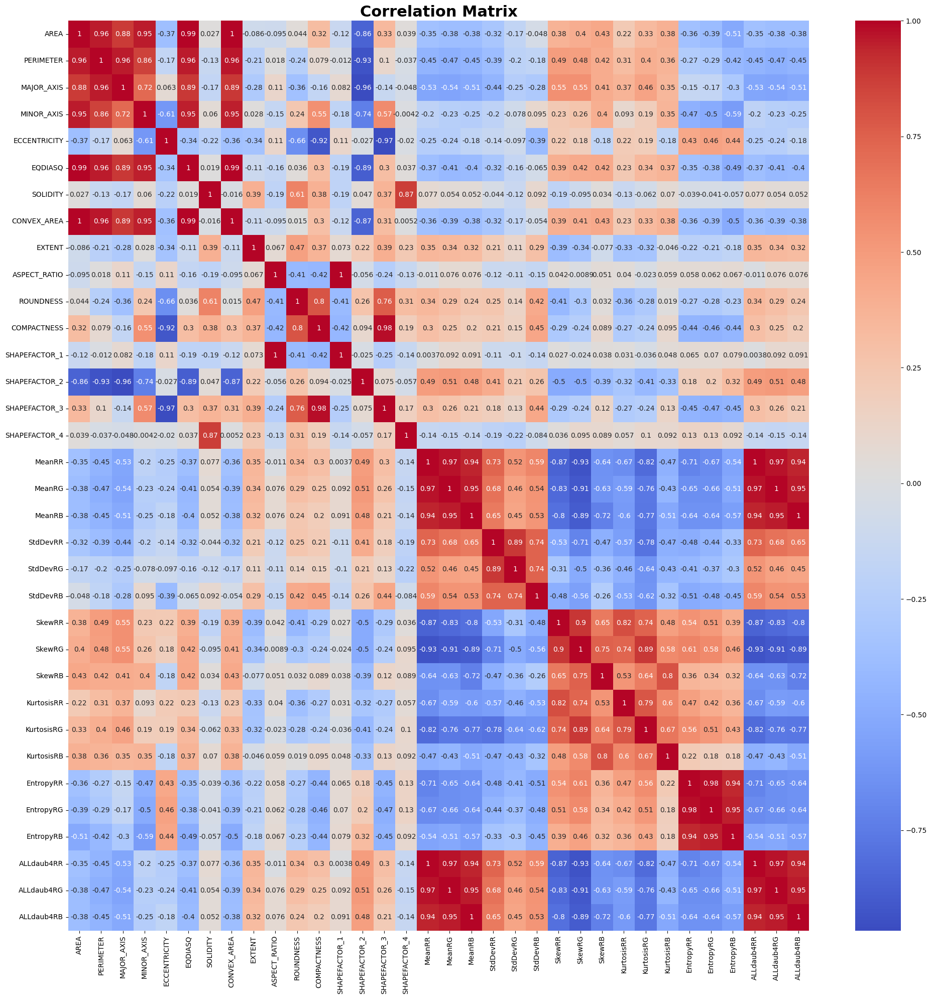

In [26]:
df_features = df.drop('Class', axis=1)

plt.figure(figsize=(20,20))

mask = np.triu(np.ones_like(df_features.corr(), dtype=bool))

sns.heatmap(df_features.corr(), annot=True, cmap='coolwarm')

plt.title("Correlation Matrix", size=22, fontweight="bold")
plt.tight_layout()

Berdasarkan scatterplot dan correlation matrix diatas, setiap fitur cenderung memiliki korelasi dengan fitur-fitur yang lain. Walaupun ada fitur yang tidak berkolerasi dengan beberapa fitur lainnya, tetap ada pasangan fitur lain yang berkolerasi. Oleh karena itu, kita tidak akan mengurangi fitur.

Selanjutnya, mari kita lihat distribusi jumlah baris untuk setiap fitur dataset dengan histogram.

array([[<Axes: title={'center': 'AREA'}>,
        <Axes: title={'center': 'PERIMETER'}>,
        <Axes: title={'center': 'MAJOR_AXIS'}>,
        <Axes: title={'center': 'MINOR_AXIS'}>,
        <Axes: title={'center': 'ECCENTRICITY'}>,
        <Axes: title={'center': 'EQDIASQ'}>],
       [<Axes: title={'center': 'SOLIDITY'}>,
        <Axes: title={'center': 'CONVEX_AREA'}>,
        <Axes: title={'center': 'EXTENT'}>,
        <Axes: title={'center': 'ASPECT_RATIO'}>,
        <Axes: title={'center': 'ROUNDNESS'}>,
        <Axes: title={'center': 'COMPACTNESS'}>],
       [<Axes: title={'center': 'SHAPEFACTOR_1'}>,
        <Axes: title={'center': 'SHAPEFACTOR_2'}>,
        <Axes: title={'center': 'SHAPEFACTOR_3'}>,
        <Axes: title={'center': 'SHAPEFACTOR_4'}>,
        <Axes: title={'center': 'MeanRR'}>,
        <Axes: title={'center': 'MeanRG'}>],
       [<Axes: title={'center': 'MeanRB'}>,
        <Axes: title={'center': 'StdDevRR'}>,
        <Axes: title={'center': 'StdDevRG'}>,
    

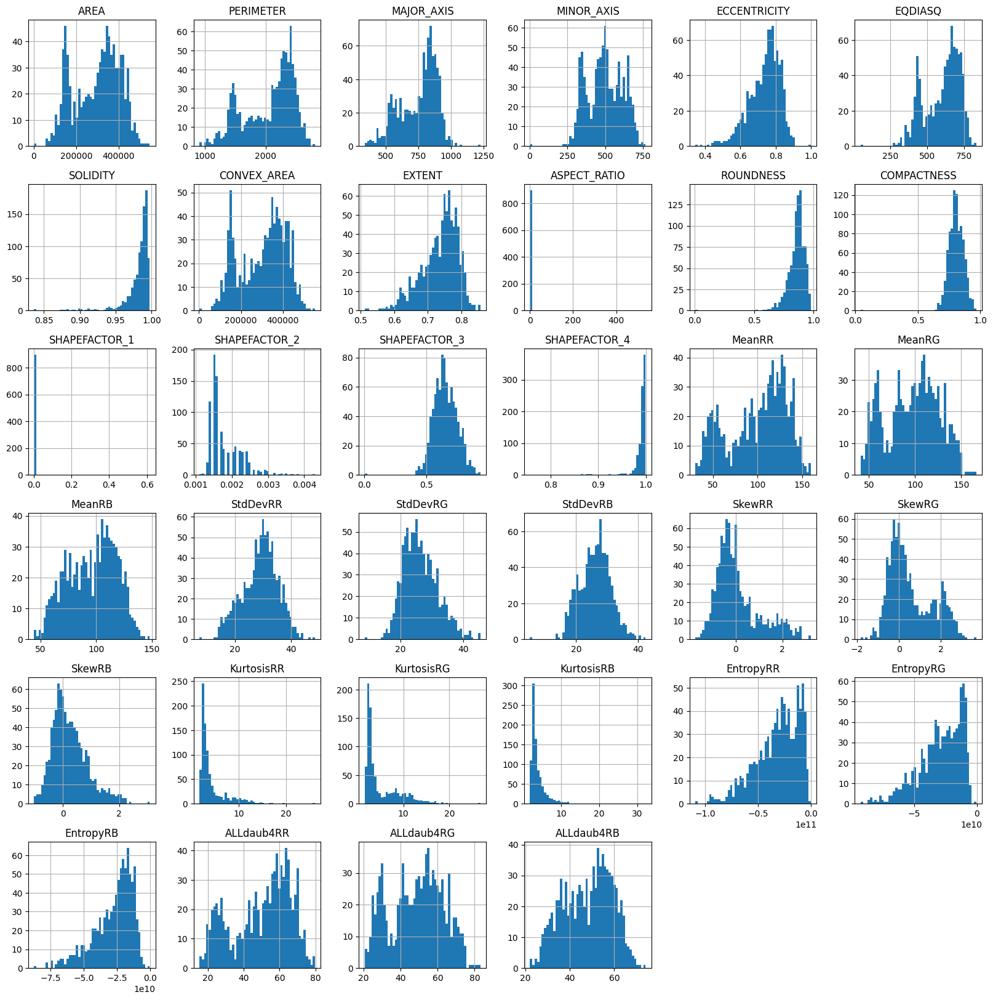

In [11]:
# histogram

df.hist(figsize=(20, 20), bins=50)

Berdasarkan gambar diatas, setiap fitur dataset memiliki skewness atau kesimetrisan yang beragam.

Berikutnya, kita lihat distribusi data untuk setiap fitur dan setiap kelas dengan KDE plot. KDE plot memungkinkan perbandingan distribusi antar kelas dalam dataset dengan visualisasi yang lebih jelas.

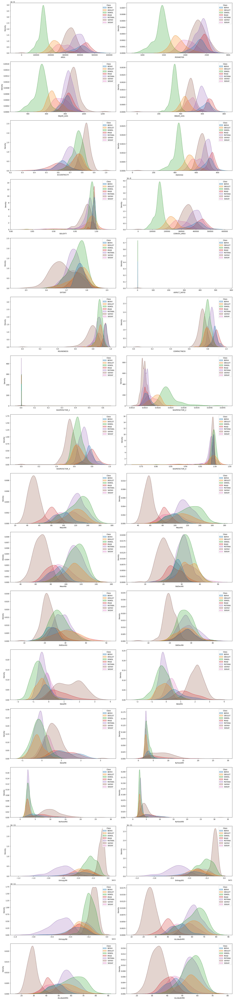

In [12]:
# KDE plot

features = [col for col in df.columns if col != 'Class']

n_rows = len(features) // 2 + len(features) % 2
n_cols =  2

fig, ax = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))

ax = ax.flatten()

for i, column in enumerate(features):
    sns.kdeplot(data=df, ax=ax[i], x=column, hue="Class", fill=True, legend=True)

plt.tight_layout()

plt.show()

KDE plot sebenarnya tidak jauh berbeda dengan histogram, namun dengan grafik yang lebih halus dan perbandingan antar kelas yang lebih jelas.

## Data Preprocessing

Kita telah melakukan eksplorasi dataset, sekarang kita akan melakukan preprocessing agar dataset dapat digunakan oleh model machine learning.

Pertama, kita lakukan pembagian dataset menjadi data training dan testing, dengan perbandingan 80:20.

In [13]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder, StandardScaler

X = df.drop("Class", axis = 1)
y = df["Class"]

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=123)

Kedua, kita lakukan normalisasi dengan StandardScaler agar semua fitur berada pada skala yang sama. Selain itu, normalisasi akan mempercepat dan mengefisiensi kinerja model machine learning.

In [14]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train = pd.DataFrame(X_train_scaled)
X_test = pd.DataFrame(X_test_scaled)

## Model Building

Pada tahap ini, beberapa model machine learning digunakan untuk mengklasifikasi varietas buah kurma. Model yang digunakan yaitu Support Vector Machine (SVM), K-Nearest Neighbors (KNN), Random Forest, Logistic Regression, Naive Bayes, Multi-Layer Perceptron (MLP), dan XGBoost.

Setiap model akan dilakukan proses training dan testing. Hasil akurasi dari setiap model akan disimpan untuk dilakukan perbandingan model terbaik.

In [15]:
model_scores = {}

### SVM

SVM adalah model machine learning yang  bekerja dengan mencari hyperplane terbaik yang memisahkan data ke dalam setiap kelas yang berbeda.

Model yang digunakan SVC (Support Vector Classifier), jenis SVM yang khusus digunakan untuk klasifikasi.Kernel yang digunakan yaitu linear dengan C=1. Parameter dipilih yang terbaik berdasarkan beberapa kali running.

In [16]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score

svm_classifier = SVC(probability=True, C=1, kernel='linear', random_state=123)

# Proses training
svm_classifier.fit(X_train, y_train)

# Proses prediksi
y_pred_svm = svm_classifier.predict(X_test)

# Evaluasi model
model_scores['SVM'] = accuracy_score(y_test, y_pred_svm) * 100

print("SVM Classification Report:\n", classification_report(y_test, y_pred_svm))
print("SVM Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_svm) * 100))

SVM Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.79      0.88        14
           1       0.79      0.69      0.73        16
           2       0.94      0.98      0.96        52
           3       0.83      0.94      0.88        16
           4       0.93      1.00      0.96        27
           5       0.97      1.00      0.99        38
           6       0.87      0.76      0.81        17

    accuracy                           0.92       180
   macro avg       0.91      0.88      0.89       180
weighted avg       0.92      0.92      0.92       180

SVM Accuracy: 92.22%


### K-Nearest Neighbors (KNN)

K-Nearest Neighbors (KNN) adalah algoritma klasifikasi yang bekerja dengan mencari sejumlah (k) tetangga terdekat dari data baru berdasarkan jarak tertentu.

In [17]:
from sklearn.neighbors import KNeighborsClassifier

knn_classifier = KNeighborsClassifier(n_neighbors=3)

# Melatih model
knn_classifier.fit(X_train, y_train)

# Menguji model
y_pred_knn = knn_classifier.predict(X_test)

# Evaluasi model
model_scores['KNN'] = accuracy_score(y_test, y_pred_knn) * 100

print("KNN Classification Report:\n", classification_report(y_test, y_pred_knn))
print("KNN Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_knn) * 100))

KNN Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.86      0.92        14
           1       0.68      0.81      0.74        16
           2       0.94      0.98      0.96        52
           3       0.88      0.88      0.88        16
           4       0.93      1.00      0.96        27
           5       0.97      0.97      0.97        38
           6       0.83      0.59      0.69        17

    accuracy                           0.91       180
   macro avg       0.89      0.87      0.88       180
weighted avg       0.91      0.91      0.91       180

KNN Accuracy: 91.11%


### Random Forest Classifier

Random Forest adalah model machine learning berbasis ensemble yang menggabungkan hasil dari banyak pohon keputusan (decision tree).

Parameter n_estimators dan max_depth dipilih berdasarkan beberapa kali hasil running.

In [18]:
from sklearn.ensemble import RandomForestClassifier

rf_classifier = RandomForestClassifier(n_estimators=100, max_depth=12, random_state=123)

# Melatih model
rf_classifier.fit(X_train, y_train)

# Menguji model
y_pred_rf = rf_classifier.predict(X_test)

# Evaluasi model
model_scores['Random Forest'] = accuracy_score(y_test, y_pred_rf) * 100

print("Random Forest Classification Report:\n", classification_report(y_test, y_pred_rf))
print("Random Forest Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_rf) * 100))

Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.79      0.85        14
           1       0.71      0.62      0.67        16
           2       0.95      1.00      0.97        52
           3       0.88      0.88      0.88        16
           4       0.93      0.93      0.93        27
           5       0.97      1.00      0.99        38
           6       0.71      0.71      0.71        17

    accuracy                           0.90       180
   macro avg       0.87      0.85      0.85       180
weighted avg       0.90      0.90      0.90       180

Random Forest Accuracy: 90.00%


### Logistic Regression

Logistic Regression adalah metode statistik yang digunakan untuk memprediksi probabilitas kejadian berdasarkan satu atau lebih variabel independen.

In [19]:
from sklearn.linear_model import LogisticRegression

lr_classifier = LogisticRegression(max_iter=1000, random_state=123)

# Melatih model
lr_classifier.fit(X_train, y_train)

# Menguji model
y_pred_lr = lr_classifier.predict(X_test)

# Evaluasi model
model_scores['Logistic Regression'] = accuracy_score(y_test, y_pred_lr) * 100

print("Logistic Regression Classification Report:\n", classification_report(y_test, y_pred_lr))
print("Logistic Regression Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_lr) * 100))


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.79      0.88        14
           1       0.80      0.75      0.77        16
           2       0.96      1.00      0.98        52
           3       0.88      0.94      0.91        16
           4       0.93      1.00      0.96        27
           5       0.97      1.00      0.99        38
           6       0.80      0.71      0.75        17

    accuracy                           0.93       180
   macro avg       0.91      0.88      0.89       180
weighted avg       0.93      0.93      0.93       180

Logistic Regression Accuracy: 92.78%


### Naive Bayes Classifier

Naive Bayes adalah algoritma klasifikasi yang didasarkan pada Teorema Bayes dengan asumsi semua fitur independen satu sama lain.

In [20]:
from sklearn.naive_bayes import GaussianNB

nb_classifier = GaussianNB()

# Melatih model
nb_classifier.fit(X_train, y_train)

# Menguji model
y_pred_nb = nb_classifier.predict(X_test)

# Evaluasi model
model_scores['Naive Bayes'] = accuracy_score(y_test, y_pred_nb) * 100

print("Naive Bayes Classification Report:\n", classification_report(y_test, y_pred_nb))
print("Naive Bayes Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_nb) * 100))

Naive Bayes Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.79      0.88        14
           1       0.67      0.62      0.65        16
           2       0.96      1.00      0.98        52
           3       0.88      0.94      0.91        16
           4       0.93      0.93      0.93        27
           5       0.97      0.97      0.97        38
           6       0.56      0.59      0.57        17

    accuracy                           0.89       180
   macro avg       0.85      0.83      0.84       180
weighted avg       0.89      0.89      0.89       180

Naive Bayes Accuracy: 88.89%


### Multi-Layer Perceptron (MLP)

Multi-Layer Perceptron (MLP) adalah jenis jaringan saraf tiruan yang terdiri dari beberapa lapisan neuron. Model ini bekerja dengan mengirimkan data melalui beberapa lapisan tersembunyi, yang memungkinkan jaringan untuk belajar representasi yang lebih kompleks dari data.

In [21]:
from sklearn.neural_network import MLPClassifier

mlp_classifier = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, alpha=0.0001,
                     solver='adam', verbose=10,  random_state=123)

# Melatih model
mlp_classifier.fit(X_train, y_train)

# Menguji model
y_pred_mlp = mlp_classifier.predict(X_test)

# Evaluasi model
model_scores['MLP'] = accuracy_score(y_test, y_pred_mlp) * 100

print('')
print("MLP Classification Report:\n", classification_report(y_test, y_pred_mlp))
print("MLP Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_mlp) * 100))

Iteration 1, loss = 2.39505695
Iteration 2, loss = 2.00027776
Iteration 3, loss = 1.66922378
Iteration 4, loss = 1.40523594
Iteration 5, loss = 1.20373751
Iteration 6, loss = 1.05197311
Iteration 7, loss = 0.94158907
Iteration 8, loss = 0.85765799
Iteration 9, loss = 0.79257425
Iteration 10, loss = 0.73819663
Iteration 11, loss = 0.69279276
Iteration 12, loss = 0.65535081
Iteration 13, loss = 0.62272141
Iteration 14, loss = 0.59489190
Iteration 15, loss = 0.56983491
Iteration 16, loss = 0.54755551
Iteration 17, loss = 0.52805584
Iteration 18, loss = 0.50953910
Iteration 19, loss = 0.49263394
Iteration 20, loss = 0.47702112
Iteration 21, loss = 0.46224563
Iteration 22, loss = 0.44877068
Iteration 23, loss = 0.43598851
Iteration 24, loss = 0.42415804
Iteration 25, loss = 0.41320593
Iteration 26, loss = 0.40245538
Iteration 27, loss = 0.39295098
Iteration 28, loss = 0.38342017
Iteration 29, loss = 0.37439177
Iteration 30, loss = 0.36587733
Iteration 31, loss = 0.35796096
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


### XGBoost

XGBoost (Extreme Gradient Boosting) adalah sebuah algoritma machine learning yang berbasis pada teknik boosting, di mana model dibangun secara bertahap dengan menambahkan model baru yang memperbaiki kesalahan dari model sebelumnya.

In [22]:
import xgboost as xgb

xgb_classifier = xgb.XGBClassifier(objective='multi:softmax', num_class=7, random_state=123) # adjust parameters as needed

# Melatih model
xgb_classifier.fit(X_train, y_train)

# Menguji model
y_pred_xgb = xgb_classifier.predict(X_test)

# Evaluasi model
model_scores['XGBoost'] = accuracy_score(y_test, y_pred_xgb) * 100

print("XGBoost Classification Report:\n", classification_report(y_test, y_pred_xgb))
print("XGBoost Accuracy: {:.2f}%".format(accuracy_score(y_test, y_pred_xgb) * 100))

XGBoost Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.86      0.92        14
           1       0.64      0.56      0.60        16
           2       0.93      1.00      0.96        52
           3       0.88      0.94      0.91        16
           4       0.93      1.00      0.96        27
           5       0.95      1.00      0.97        38
           6       0.83      0.59      0.69        17

    accuracy                           0.91       180
   macro avg       0.88      0.85      0.86       180
weighted avg       0.90      0.91      0.90       180

XGBoost Accuracy: 90.56%


## Evaluation

Pada tahap evaluasi, metrik yang digunakan adalah akurasi. Akurasi mengukur persentase jumlah prediksi yang benar dari total prediksi. Di bawah ini merupakan dataframe akurasi hasil testing dari model-model yang digunakan.

In [23]:
df_model_scores = pd.DataFrame.from_dict(model_scores, orient='index', columns=['Accuracy'])
df_model_scores

,Accuracy
SVM,92.222222
KNN,91.111111
Random Forest,90.000000
Logistic Regression,92.777778
Naive Bayes,88.888889
MLP,90.555556
XGBoost,90.555556


Berikut merupakan visualisasi perbandingan akurasi dari semua model.

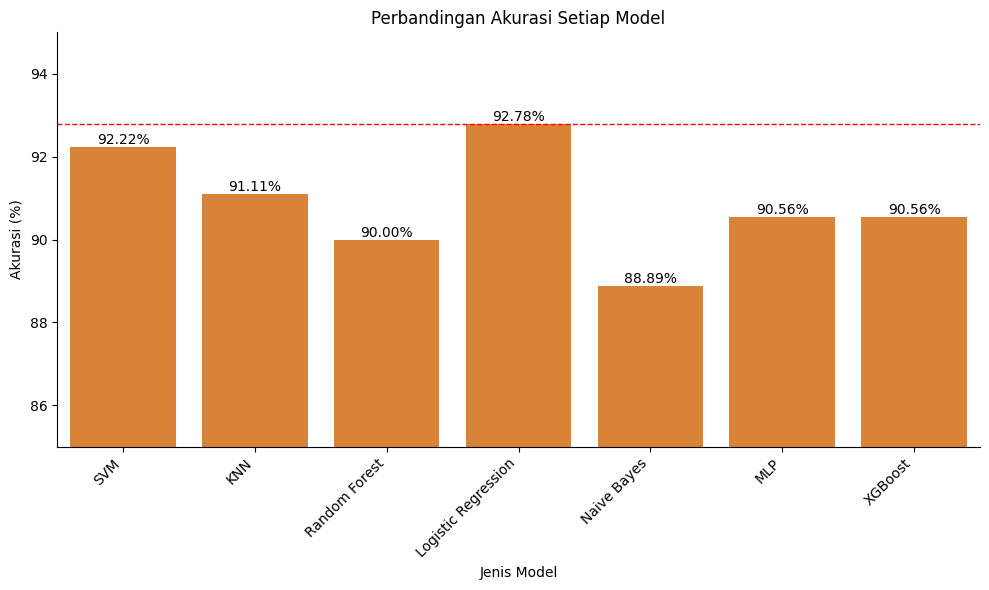

In [25]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=df_model_scores.index, y='Accuracy', data=df_model_scores, color='#f4811d')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.title('Perbandingan Akurasi Setiap Model')
plt.xlabel('Jenis Model')
plt.ylabel('Akurasi (%)')
plt.xticks(rotation=45, ha='right')
plt.ylim(85, 95)  # Limit y-axis from 85 to 95

ax.axhline(y = max(df_model_scores['Accuracy'].tolist()) , linewidth = 1, color = "red", linestyle="dashed")

for p in ax.patches:
    x = p.get_bbox().get_points()[:, 0]
    y = p.get_bbox().get_points()[1, 1]
    ax.annotate('{:.2f}%'.format(y), (x.mean(), y), ha='center', va='bottom')

plt.tight_layout()
plt.show()

Berdasarkan grafik di atas, semua model mendapatkan hasil yang baik dengan akurasi terendah yaitu Naive Bayes dengan akurasi 88.89% dan akurasi terbaik yaitu Logistic Regression dengan akurasi 92.78%.

## Summary

Berdasarkan percobaan-percobaan yang telah dilakukan, model machine learning berhasil mendapatkan hasil yang baik dalam mengklasifikasikan varietas kurma. Model machine learning yang mendapatkan akurasi  terbaik adalah Logistic Regression dengan akurasi 92.78%.